In [1]:
import pandas as pd
import numpy as np

In [11]:
import os
print(os.getcwd())

c:\Users\bibek\ml-projects\BENGALURU-HOUSE-PREDICTION\notebooks


In [8]:
data = pd.read_csv('../data/Bengaluru_House_Data.csv')

In [127]:
df=data.copy()

In [128]:
pd.set_option('display.max_rows', None)

In [129]:
df

,area_type,availability,location,size,society,total_sqft,bath,balcony,price
0,Super built-up Area,19-Dec,Electronic City Phase II,2 BHK,Coomee,1056,2.00,1.00,39.07
1,Plot Area,Ready To Move,Chikka Tirupathi,4 Bedroom,Theanmp,2600,5.00,3.00,120.00
2,Built-up Area,Ready To Move,Uttarahalli,3 BHK,NaN,1440,2.00,3.00,62.00
3,Super built-up Area,Ready To Move,Lingadheeranahalli,3 BHK,Soiewre,1521,3.00,1.00,95.00
4,Super built-up Area,Ready To Move,Kothanur,2 BHK,NaN,1200,2.00,1.00,51.00
5,Super built-up Area,Ready To Move,Whitefield,2 BHK,DuenaTa,1170,2.00,1.00,38.00
6,Super built-up Area,18-May,Old Airport Road,4 BHK,Jaades,2732,4.00,NaN,204.00
7,Super built-up Area,Ready To Move,Rajaji Nagar,4 BHK,Brway G,3300,4.00,NaN,600.00
8,Super built-up Area,Ready To Move,Marathahalli,3 BHK,NaN,1310,3.00,1.00,63.25
9,Plot Area,Ready To Move,Gandhi Bazar,6 Bedroom,NaN,1020,6.00,NaN,370.00


In [14]:
df.head()

,area_type,availability,location,size,society,total_sqft,bath,balcony,price
0,Super built-up Area,19-Dec,Electronic City Phase II,2 BHK,Coomee,1056,2.0,1.0,39.07
1,Plot Area,Ready To Move,Chikka Tirupathi,4 Bedroom,Theanmp,2600,5.0,3.0,120.00
2,Built-up Area,Ready To Move,Uttarahalli,3 BHK,NaN,1440,2.0,3.0,62.00
3,Super built-up Area,Ready To Move,Lingadheeranahalli,3 BHK,Soiewre,1521,3.0,1.0,95.00
4,Super built-up Area,Ready To Move,Kothanur,2 BHK,NaN,1200,2.0,1.0,51.00


In [16]:
df.shape


(13320, 9)

In [17]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13320 entries, 0 to 13319
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   area_type     13320 non-null  object 
 1   availability  13320 non-null  object 
 2   location      13319 non-null  object 
 3   size          13304 non-null  object 
 4   society       7818 non-null   object 
 5   total_sqft    13320 non-null  object 
 6   bath          13247 non-null  float64
 7   balcony       12711 non-null  float64
 8   price         13320 non-null  float64
dtypes: float64(3), object(6)
memory usage: 936.7+ KB


In [18]:
df.describe()

,bath,balcony,price
count,13247.000000,12711.000000,13320.000000
mean,2.692610,1.584376,112.565627
std,1.341458,0.817263,148.971674
min,1.000000,0.000000,8.000000
25%,2.000000,1.000000,50.000000
50%,2.000000,2.000000,72.000000
75%,3.000000,2.000000,120.000000
max,40.000000,3.000000,3600.000000


In [20]:
df.isnull().sum()/100

area_type        0.00
availability     0.00
location         0.01
size             0.16
society         55.02
total_sqft       0.00
bath             0.73
balcony          6.09
price            0.00
dtype: float64

In [21]:
df['location'].value_counts()

location
Whitefield                                            540
Sarjapur  Road                                        399
Electronic City                                       302
Kanakpura Road                                        273
Thanisandra                                           234
Yelahanka                                             213
Uttarahalli                                           186
Hebbal                                                177
Marathahalli                                          175
Raja Rajeshwari Nagar                                 171
Hennur Road                                           152
Bannerghatta Road                                     152
7th Phase JP Nagar                                    149
Haralur Road                                          142
Electronic City Phase II                              132
Rajaji Nagar                                          107
Chandapura                                            100
Bella

<Axes: xlabel='price', ylabel='Count'>

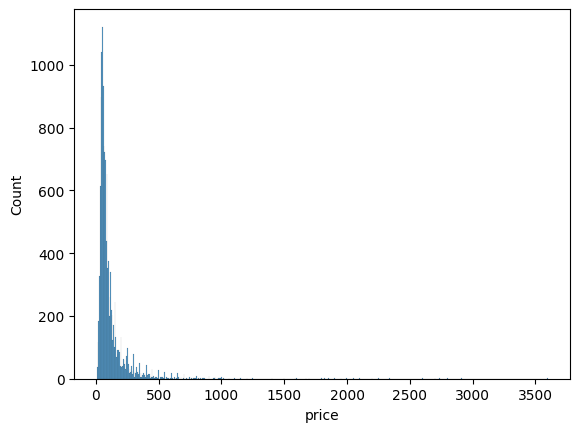

In [22]:
import seaborn as sns
sns.histplot(df['price'])

In [47]:
df.groupby('area_type')['area_type'].agg('count')

area_type
Built-up  Area          2418
Carpet  Area              87
Plot  Area              2025
Super built-up  Area    8790
Name: area_type, dtype: int64

In [130]:
df1=df.drop(['area_type','society','balcony','availability'],axis='columns')
df1.head()

,location,size,total_sqft,bath,price
0,Electronic City Phase II,2 BHK,1056,2.00,39.07
1,Chikka Tirupathi,4 Bedroom,2600,5.00,120.00
2,Uttarahalli,3 BHK,1440,2.00,62.00
3,Lingadheeranahalli,3 BHK,1521,3.00,95.00
4,Kothanur,2 BHK,1200,2.00,51.00


In [131]:
df1.isnull().sum()

location       1
size          16
total_sqft     0
bath          73
price          0
dtype: int64

In [132]:
df1['bhk']=df1['size'].apply(lambda x: int(x.split(' ')[0]) if pd.notnull(x) else None)

In [133]:
df1.head()

,location,size,total_sqft,bath,price,bhk
0,Electronic City Phase II,2 BHK,1056,2.00,39.07,2.00
1,Chikka Tirupathi,4 Bedroom,2600,5.00,120.00,4.00
2,Uttarahalli,3 BHK,1440,2.00,62.00,3.00
3,Lingadheeranahalli,3 BHK,1521,3.00,95.00,3.00
4,Kothanur,2 BHK,1200,2.00,51.00,2.00


In [134]:
df1[df1['bath'].isna()]

,location,size,total_sqft,bath,price,bhk
56,Devanahalli,4 Bedroom,3010 - 3410,NaN,192.00,4.00
81,Hennur Road,4 Bedroom,2957 - 3450,NaN,224.50,4.00
224,Devanahalli,3 BHK,1520 - 1740,NaN,74.82,3.00
344,Kanakpura Road,1 BHK,525,NaN,21.53,1.00
579,Sarjapur Road,NaN,1200 - 2400,NaN,34.19,NaN
669,JP Nagar,5 BHK,4400 - 6640,NaN,375.00,5.00
702,JP Nagar,5 BHK,4400 - 6800,NaN,548.50,5.00
801,JP Nagar,4 BHK,4000 - 5249,NaN,453.00,4.00
941,Whitefield,4 Bedroom,3606 - 5091,NaN,304.00,4.00
1264,Hennur,3 Bedroom,2264,NaN,155.00,3.00


In [135]:
# - Outliers in 'bath' column were removed using domain rule (bath <= bhk + 2)
# - Missing values were filled using median grouped by BHK to maintain realistic distribution
df1= df1[df1['bath'] <= df1['bhk'] + 2]


In [136]:
df1[df1['bath'] > df1['bhk'] + 2].shape

(0, 6)

In [138]:
df1[df1['bath']>10]

,location,size,total_sqft,bath,price,bhk
938,5th Phase JP Nagar,9 Bedroom,1260,11.00,290.00,9.00
1718,2Electronic City Phase II,27 BHK,8000,27.00,230.00,27.00
1768,1 Ramamurthy Nagar,11 Bedroom,1200,11.00,170.00,11.00
3096,Jp nagar 8th Phase .,10 BHK,12000,12.00,525.00,10.00
3379,1Hanuman Nagar,19 BHK,2000,16.00,490.00,19.00
3609,Koramangala Industrial Layout,16 BHK,10000,16.00,550.00,16.00
4684,Munnekollal,43 Bedroom,2400,40.00,660.00,43.00
4916,1Channasandra,14 BHK,1250,15.00,125.00,14.00
7979,1 Immadihalli,11 BHK,6000,12.00,150.00,11.00
8636,Neeladri Nagar,10 BHK,4000,12.00,160.00,10.00


In [139]:
# Outlier detection was performed on the 'bath' feature using the rule (bath <= bhk + 2).
# No significant outliers were found, indicating the data is already consistent.

In [140]:
# df['bath'].fillna(df['bath'].median(), inplace=True)
df1['bath']=df1.groupby('bhk')['bath'].transform(lambda x:x.fillna(x.median()))

In [141]:
df1['bath'].isna().sum()

np.int64(0)

In [142]:
df1['bath'].describe()

count   13231.00
mean        2.68
std         1.32
min         1.00
25%         2.00
50%         2.00
75%         3.00
max        40.00
Name: bath, dtype: float64

In [143]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
Index: 13231 entries, 0 to 13319
Data columns (total 6 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   location    13230 non-null  object 
 1   size        13231 non-null  object 
 2   total_sqft  13231 non-null  object 
 3   bath        13231 non-null  float64
 4   price       13231 non-null  float64
 5   bhk         13231 non-null  float64
dtypes: float64(3), object(3)
memory usage: 723.6+ KB


In [ ]:
# THe bhk part and bath room logis is clear till now!!
df1_b=df1.copy()


In [145]:
df1['total_sqft'].unique()[:210]

array(['1056', '2600', '1440', '1521', '1200', '1170', '2732', '3300',
       '1310', '1020', '1800', '2785', '1000', '1100', '2250', '1175',
       '1180', '1540', '2770', '600', '1755', '2800', '1767', '510',
       '1250', '660', '1610', '1151', '1025', '2100 - 2850', '1075',
       '1760', '1693', '1925', '700', '1070', '1724', '1290', '1143',
       '1296', '1254', '1330.74', '970', '1459', '800', '869', '1270',
       '1670', '2010', '1185', '1600', '1500', '1407', '840', '4395',
       '845', '5700', '1160', '3000', '1140', '1220', '1350', '1005',
       '500', '1358', '1569', '1240', '2089', '1206', '1150', '2511',
       '460', '4400', '1660', '1326', '1325', '1499', '1665', '708',
       '1060', '710', '1450', '2894', '1330', '2502', '650', '2400',
       '1007', '966', '1630', '1640', '782', '1260', '1413', '1116',
       '1530', '3700', '2497', '1436', '276', '1427', '2061',
       '3067 - 8156', '2650', '1282', '1050', '945', '950', '1870', '880',
       '1535', '1360', '1

In [65]:
def is_float(x):
    try:
        float(x)
        return True
    except:
        return False

df1[~df1['total_sqft'].apply(is_float)]['total_sqft']

30             2100 - 2850
122            3067 - 8156
137            1042 - 1105
165            1145 - 1340
188            1015 - 1540
410         34.46Sq. Meter
549            1195 - 1440
648              4125Perch
661            1120 - 1145
672            3090 - 5002
772            1160 - 1195
775          1000Sq. Meter
850            1115 - 1130
872          1100Sq. Yards
886              520 - 645
927            1000 - 1285
959              650 - 665
990              633 - 666
1019             5.31Acres
1086               30Acres
1178           1445 - 1455
1183            884 - 1116
1187            850 - 1093
1400          716Sq. Meter
1484       547.34 - 827.31
1542             580 - 650
1614           3425 - 3435
1643           1804 - 2273
1683           3630 - 3800
1694           4000 - 5249
1712         1500Sq. Meter
1743       142.61Sq. Meter
1821         1574Sq. Yards
2088           1250 - 1305
2128             670 - 980
2228     1005.03 - 1252.49
2265           3630 - 3800
2

In [146]:
df1[~df1['total_sqft'].apply(is_float)]['total_sqft'].nunique()

173

In [147]:
conversion={
    'Sq. Meter': 10.7639,
    'Sq. Yards': 9,
    'Perch': 272.25,
    'Acres': 43560,
    'Guntha': 1089,
    'Cents': 435.6,
    'Grounds': 2400
}

In [148]:
def convert_sqft(x):
    try:
        x=str(x).strip()

        for unit in conversion:
            if unit in x:
                value=x.replace(unit,'').strip()

                if '-' in value:
                    a,b=value.split('-')
                    value=(float(a)+float(b))/2
                else:
                    value=float(value)

                
                return value*conversion[unit]
    
        if '-' in x:
            a,b=x.split('-')
            return (float(a)+float(b))/2
        
        return float(x)
    
    except:
        return None

In [149]:
df1.head()

,location,size,total_sqft,bath,price,bhk
0,Electronic City Phase II,2 BHK,1056,2.00,39.07,2.00
1,Chikka Tirupathi,4 Bedroom,2600,5.00,120.00,4.00
2,Uttarahalli,3 BHK,1440,2.00,62.00,3.00
3,Lingadheeranahalli,3 BHK,1521,3.00,95.00,3.00
4,Kothanur,2 BHK,1200,2.00,51.00,2.00


In [150]:
df1['n_total_sqft']=df1['total_sqft'].apply(convert_sqft)

In [151]:
df1.isnull().sum()

location        1
size            0
total_sqft      0
bath            0
price           0
bhk             0
n_total_sqft    0
dtype: int64

In [152]:
df1.loc[6268]

location            Chickpet
size                   2 BHK
total_sqft      122Sq. Yards
bath                    2.00
price                  48.00
bhk                     2.00
n_total_sqft         1098.00
Name: 6268, dtype: object

In [153]:
df1

,location,size,total_sqft,bath,price,bhk,n_total_sqft
0,Electronic City Phase II,2 BHK,1056,2.00,39.07,2.00,1056.00
1,Chikka Tirupathi,4 Bedroom,2600,5.00,120.00,4.00,2600.00
2,Uttarahalli,3 BHK,1440,2.00,62.00,3.00,1440.00
3,Lingadheeranahalli,3 BHK,1521,3.00,95.00,3.00,1521.00
4,Kothanur,2 BHK,1200,2.00,51.00,2.00,1200.00
5,Whitefield,2 BHK,1170,2.00,38.00,2.00,1170.00
6,Old Airport Road,4 BHK,2732,4.00,204.00,4.00,2732.00
7,Rajaji Nagar,4 BHK,3300,4.00,600.00,4.00,3300.00
8,Marathahalli,3 BHK,1310,3.00,63.25,3.00,1310.00
9,Gandhi Bazar,6 Bedroom,1020,6.00,370.00,6.00,1020.00


In [154]:
df1['price_per_sqft']=df1['price']*100000/df1['n_total_sqft']

In [155]:
pd.options.display.float_format = '{:.2f}'.format

In [ ]:
# Till now the sqft and bhk logic along wht ppersqft,bath roomm all sorteed
df1_bsqf=df1.copy()

In [199]:
df1=df1_bsqf.copy()

In [200]:
df1['location'] = df1['location'].str.lower()
df1['location'] = df1['location'].str.strip()
df1['location'] = df1['location'].str.replace(',', '')

In [201]:
df1['location'] = df1['location'].replace({
    'electronic city phase 1': 'electronic city phase i',
    'electronics city phase 2': 'electronic city phase ii'
})

In [202]:
location_stats = df1['location'].value_counts()

In [203]:
loc_less_5 = location_stats[location_stats <= 5].index

In [204]:
df1['location'] = df1['location'].apply(
    lambda x: 'other' if x in loc_less_5 else x
)

In [205]:
print(len(loc_less_5))

888


In [206]:
df1['location'].value_counts().head(20)

location
other                       1776
whitefield                   537
sarjapur  road               392
electronic city              303
kanakpura road               266
thanisandra                  235
yelahanka                    210
uttarahalli                  186
hebbal                       176
marathahalli                 175
raja rajeshwari nagar        171
bannerghatta road            152
hennur road                  150
7th phase jp nagar           149
haralur road                 142
electronic city phase ii     131
rajaji nagar                 105
chandapura                    98
bellandur                     97
hoodi                         88
Name: count, dtype: int64

In [207]:
df1['location'] = df1['location'].str.replace('  ', ' ')

In [208]:
df1['price_per_sqft'].describe()

count      13231.00
mean        7901.49
std       106603.53
min            2.26
25%         4262.30
50%         5428.57
75%         7310.01
max     12000000.00
Name: price_per_sqft, dtype: float64

In [223]:
df1[df1['price_per_sqft']>=200000]

,location,size,total_sqft,bath,price,bhk,n_total_sqft,price_per_sqft
349,other,3 Bedroom,11,3.00,74.00,3.00,11.00,672727.27
1020,other,1 BHK,15,1.00,30.00,1.00,15.00,200000.00
1122,other,5 Bedroom,24,2.00,150.00,5.00,24.00,625000.00
4086,sarjapur road,4 Bedroom,1,4.00,120.00,4.00,1.00,12000000.00
4972,other,7 BHK,5,7.00,115.00,7.00,5.00,2300000.00
11558,whitefield,4 Bedroom,60,4.00,218.00,4.00,60.00,363333.33


In [ ]:
# df.shape

(13320, 9)

In [230]:
df1=df1[df1['n_total_sqft']>=300]

In [232]:
df1['price_per_sqft'].describe()

count    13219.00
mean      6677.39
std       4581.60
min          2.26
25%       4260.87
50%       5425.71
75%       7300.43
max     176470.59
Name: price_per_sqft, dtype: float64

In [213]:
print('price_per_sqft' in df.columns)
# If this returns False, the column is missing or misspelled.


False


In [215]:
df1.head()

,location,size,total_sqft,bath,price,bhk,n_total_sqft,price_per_sqft
0,electronic city phase ii,2 BHK,1056,2.00,39.07,2.00,1056.00,3699.81
1,chikka tirupathi,4 Bedroom,2600,5.00,120.00,4.00,2600.00,4615.38
2,uttarahalli,3 BHK,1440,2.00,62.00,3.00,1440.00,4305.56
3,lingadheeranahalli,3 BHK,1521,3.00,95.00,3.00,1521.00,6245.89
4,kothanur,2 BHK,1200,2.00,51.00,2.00,1200.00,4250.00


In [237]:


def remove_pps_outliers(df):
    df_out = pd.DataFrame()
    
    for location, subdf in df.groupby('location'):
        mean = np.mean(subdf['price_per_sqft'])
        std = np.std(subdf['price_per_sqft'])
        
        reduced_df = subdf[
            (subdf['price_per_sqft'] > (mean - std)) &
            (subdf['price_per_sqft'] <= (mean + std))
        ]
        
        df_out = pd.concat([df_out, reduced_df], ignore_index=True)
    
    return df_out

In [239]:
df1 =remove_pps_outliers(df1)

In [241]:
df1[df1['price_per_sqft'] < 20000]

,location,size,total_sqft,bath,price,bhk,n_total_sqft,price_per_sqft
0,1st block hrbr layout,8 Bedroom,1200,7.00,235.00,8.00,1200.00,19583.33
3,1st block jayanagar,3 BHK,1630,3.00,194.00,3.00,1630.00,11901.84
4,1st block jayanagar,3 BHK,1875,2.00,235.00,3.00,1875.00,12533.33
5,1st block jayanagar,3 BHK,1200,2.00,130.00,3.00,1200.00,10833.33
6,1st block jayanagar,2 BHK,1235,2.00,148.00,2.00,1235.00,11983.81
7,1st block koramangala,2 BHK,1415,2.00,110.00,2.00,1415.00,7773.85
8,1st block koramangala,2 BHK,860,2.00,65.50,2.00,860.00,7616.28
9,1st block koramangala,4 BHK,3000,3.00,300.00,4.00,3000.00,10000.00
10,1st block koramangala,3 BHK,2350,3.00,210.00,3.00,2350.00,8936.17
11,1st phase jp nagar,4 BHK,2825,4.00,250.00,4.00,2825.00,8849.56


In [ ]:
df1_fin=df1.copy()
# Kept the copy of df and  here  most of the steps are done till now

In [243]:
df1 = df1.drop('price_per_sqft', axis=1)

In [245]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7277 entries, 0 to 7276
Data columns (total 7 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   location      7277 non-null   object 
 1   size          7277 non-null   object 
 2   total_sqft    7277 non-null   object 
 3   bath          7277 non-null   float64
 4   price         7277 non-null   float64
 5   bhk           7277 non-null   float64
 6   n_total_sqft  7277 non-null   float64
dtypes: float64(4), object(3)
memory usage: 398.1+ KB


In [246]:
df1=df1.drop(['size','total_sqft'],axis=1)

In [247]:
df1.head()

,location,bath,price,bhk,n_total_sqft
0,1st block hrbr layout,7.00,235.00,8.00,1200.00
1,1st block hrbr layout,3.00,125.00,3.00,600.00
2,1st block hrbr layout,4.00,125.00,3.00,600.00
3,1st block jayanagar,3.00,194.00,3.00,1630.00
4,1st block jayanagar,2.00,235.00,3.00,1875.00


In [248]:
df1 = df1.rename(columns={'n_total_sqft': 'total_sqft'})

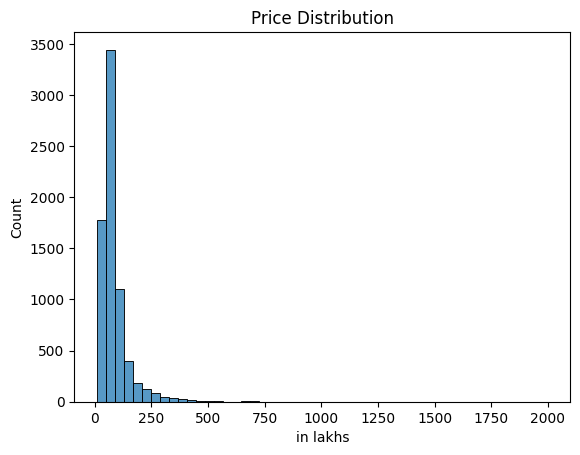

In [251]:
import seaborn as sns
import matplotlib.pyplot as plt

sns.histplot(df1['price'], bins=50)
plt.title("Price Distribution")
plt.xlabel("in lakhs")
plt.show()

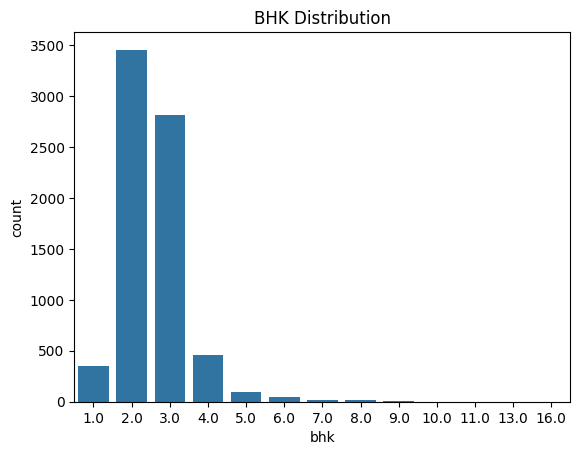

In [252]:
sns.countplot(x='bhk', data=df1)
plt.title("BHK Distribution")
plt.show()

In [255]:
df1[df1['total_sqft']>10000]

,location,bath,price,bhk,total_sqft
1547,dodsworth layout,4.00,1824.00,6.00,30400.00
4429,other,12.00,525.00,10.00,12000.00
6735,whitefield,4.00,700.00,4.00,11890.00
7213,yemlur,9.00,1900.00,8.00,12000.00
7214,yemlur,5.00,2000.00,4.00,11000.00


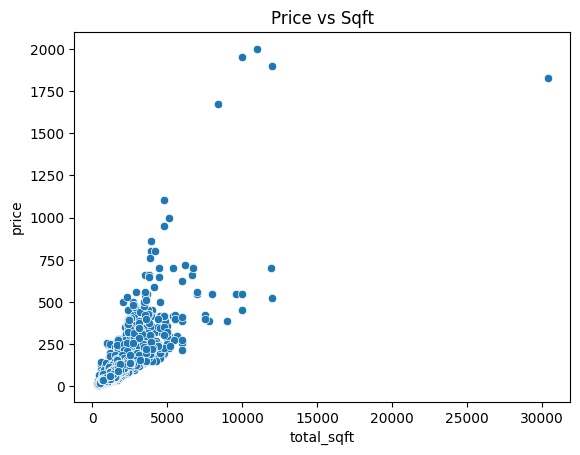

In [253]:
sns.scatterplot(x='total_sqft', y='price', data=df1)
plt.title("Price vs Sqft")
plt.show()

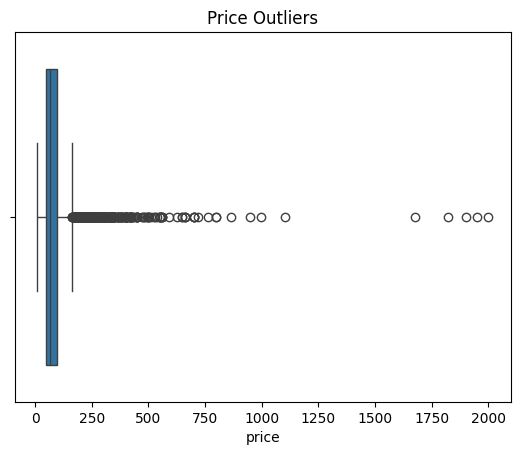

In [257]:
sns.boxplot(x=df1['price'])
plt.title("Price Outliers")
plt.show()

In [ ]:
# Basic visualizations were performed to understand distributions and relationships between features. 
# Most insights were derived during data cleaning and preprocessing stages.

In [249]:
df1.to_csv("../data/cleaned_data.csv",index=False)